# Dataset to estimate retrieval quality

I use two metric to estimate quality of retrieval:
1. `precision@k`: fraction of relevant results across all results for given query
2. `means reciprocal rank`: also practically a fraction of relevant results, but weighted by rank

In first iteration, I have prepared a manual dataset for quality estimation in a way which is conceptually wrong: I have selected several (20) portraits, and accompanied them with queries which I would expect to work for them. Instead, I should start with queries, and provider specific portraits which I consider relevant for them. This would practically mean looking over 900 portraits I have now, but I think I can do that.

So I want to rework the current structure of the test dataset to the following:
```
queries:
    query: "Enraged brutal male barbarian covered in blooed with an axe and a sword"
    portraits:
        - "nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Barbarian/Barbarian, Invulnerable Rager/HE-BA-BR-M208/Fulllength.png"
    query: "Human demon slayer in natural armor with big scary weapon"
    portraits:
        - "nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Barbarian/Barbarian, Invulnerable Rager/HE-BA-BR-M208/Fulllength.png"
```
Here I would like to automatically trasnform the dataset I have prepared, and test those queries using existing retriever.


In [1]:
from pathlib import Path

base_path = Path().absolute().parent / "dataset/v1"
base_path.exists()

True

In [21]:
import yaml
from collections import OrderedDict

yaml.add_representer(
    OrderedDict,
    lambda dumper, data: dumper.represent_dict(data.items()),
    Dumper=yaml.SafeDumper
)

def transform_dataset_file(file_path):
    with open(file_path) as f:
        dataset = yaml.safe_load(f)
        print(file_path)
    if "path" not in dataset:
        return
    
    queries = []
    for query in dataset["queries"]:
        new_query = OrderedDict()
        new_query["query"] = query
        new_query["portraits"] = [dataset["path"]]
        queries.append(new_query)

    new_dataset = {"queries": queries}
    with open(file_path, "w") as f:
        yaml.safe_dump(new_dataset, f, sort_keys=False)


for file_path in base_path.glob('*.yaml'):
    transform_dataset_file(file_path)

/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/tanky.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/inquisitor-hammer.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/dreamy-woman.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/human-druid-cleric.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/man-portrait.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/gnome-rogue.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/red-cape-assasin.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/elf-fire-blades.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/brutal-warrior.yaml
/home/tsdaemon/PROJECTS/portrait-search/dataset/v1/org-twohanded-rogue.yaml


Anot problem that I have is that I don't really separate portraits I already have embeddings for, and portraits which not yet were indexed. I am not sure whether its better to finish generation of descriptions: its likely will take several days, or just write a script to separate v1 portraits in a separate folder. Guess, the latter is better.

In [2]:
%load_ext dotenv
%dotenv

In [3]:
from portrait_search.dependencies import Container
from pathlib import Path

container = Container()
container.init_resources()
portrait_repository = container.portrait_repository()
portrait_repository

/home/tsdaemon/.cache/pypoetry/virtualenvs/portrait-search-PDxvISEv-py3.11/lib/python3.11/site-packages/InstructorEmbedding/instructor.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import trange


load INSTRUCTOR_Transformer
max_seq_length  512


In [4]:
all_portraits = await portrait_repository.get_many()
len(all_portraits)

911

In [5]:
portraits_path = Path().absolute().parent / ".data/portraits"
new_portraits_path = portraits_path.parent / "v1"
portraits_path.exists()

True

In [6]:
import shutil

for portrait in all_portraits:
    fl_path = portraits_path / portrait.fulllength_path
    new_fl_path = new_portraits_path / portrait.fulllength_path
    new_fl_path.parent.mkdir(parents=True, exist_ok=True)

    # Copy the file
    shutil.copy2(fl_path, new_fl_path)


In [7]:
retriever = container.retriever()
retriever

 closed helmet knight with a halberd


closed helmet knight with a halberd


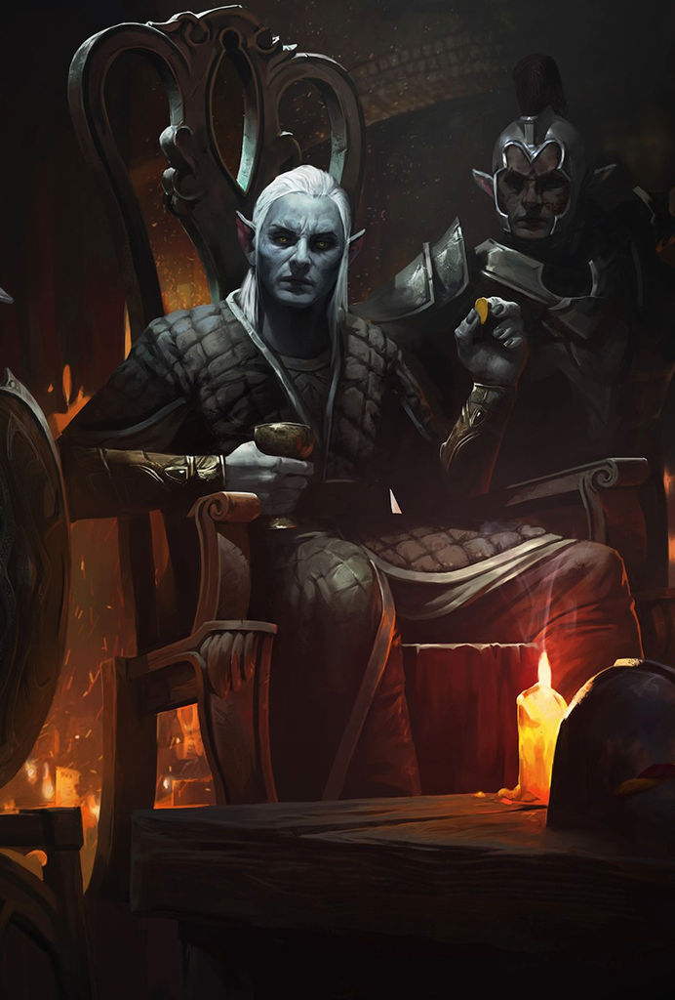

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Wizard, Sorcerer, Kineticist/Wizard, Sorcerer, Arcane Trickster, Mystic Theurge, Dragon Disciple/HE-WS-MS-M146/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: weapon, which doesn't provide clues to his preferred combat style, but the presence of a heavily armored figure behind
Similarity: 0.10893523693084717

********************************************************************************

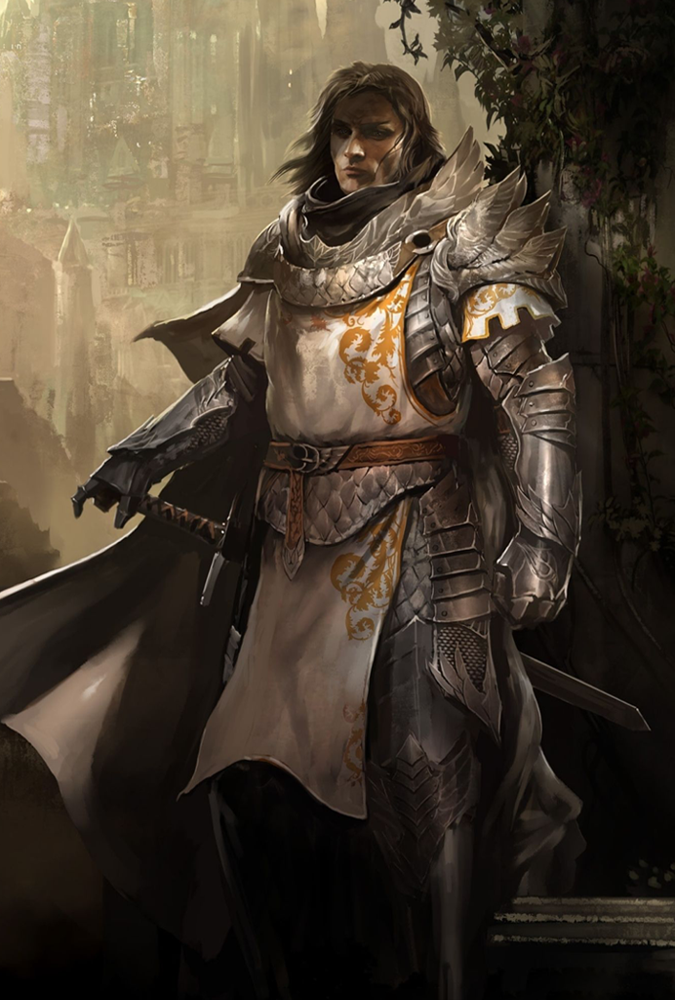

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Paladin, Cleric/Paladin, Hospitaler, Divine Guardian, Crusader/HE-PC-PL-M105/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: to chivalric codes and orders of knights. His heavy armor implies he is prepared for frontline combat and may hold a
Similarity: 0.10839617252349854

********************************************************************************

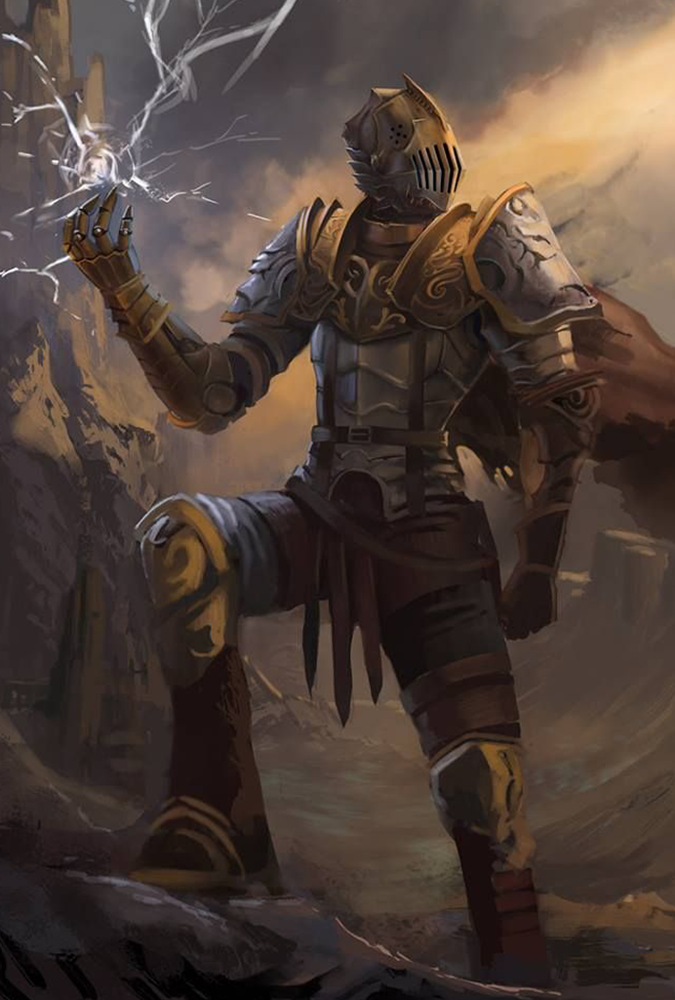

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Magus, Kinetic Knight/Magus, Eldritch Scion, Sword Saint, Eldritch Knight, Kinetic Knight/HE-FM-FM-M217/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: something like a longsword, flail, or warhammer based on their armored appearance.
Similarity: 0.1082226037979126

********************************************************************************

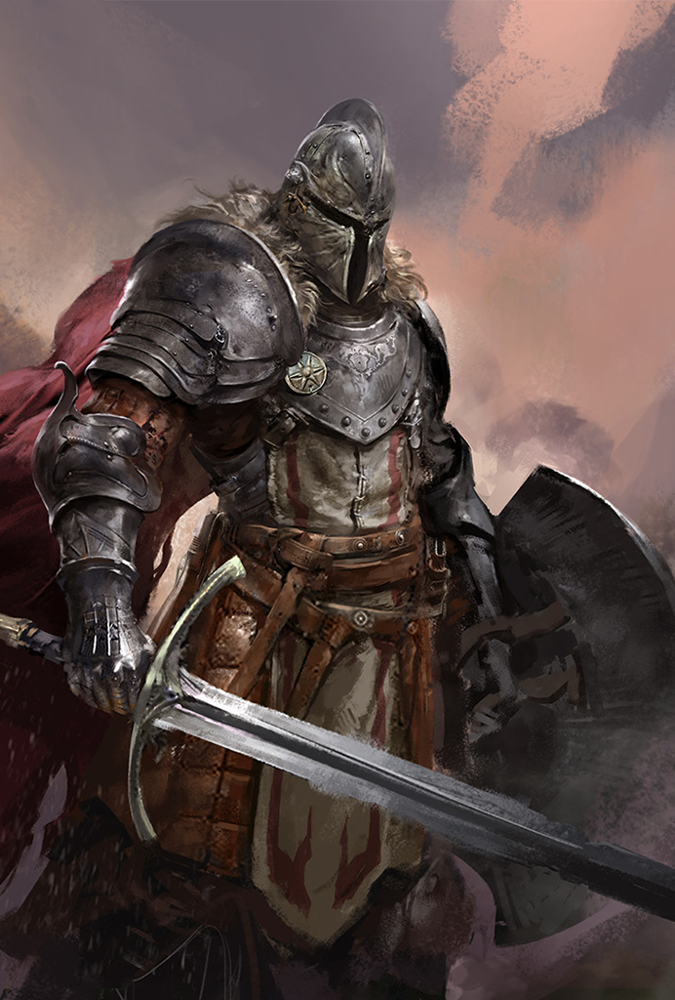

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Melee, Fighter/Shield (Stalwart Defender, Tower Shield Specialist)/HE-MF-SH-M211/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: steel plate mail, indicative of a warrior trained for heavy combat. The helm conceals the character's face, but the
Similarity: 0.10715174674987793

********************************************************************************

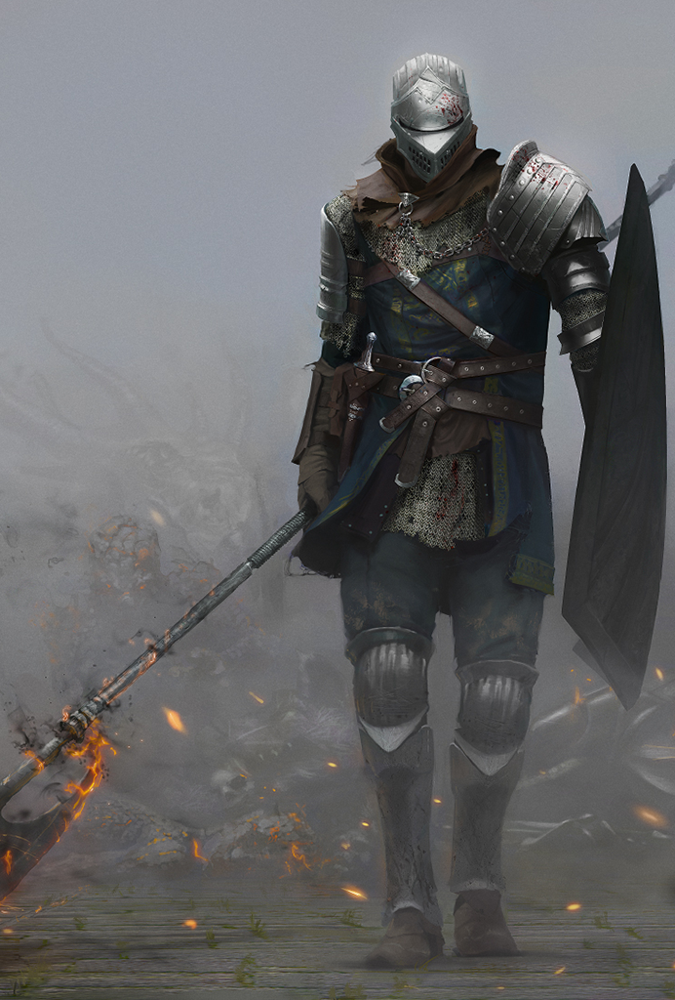

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Melee, Fighter/Shield (Stalwart Defender, Tower Shield Specialist)/HE-MF-SH-M215/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: The helm is a visored piece with intricate designs, hinting at some noble or knightly status. They wield in their right
Similarity: 0.10663747787475586

********************************************************************************

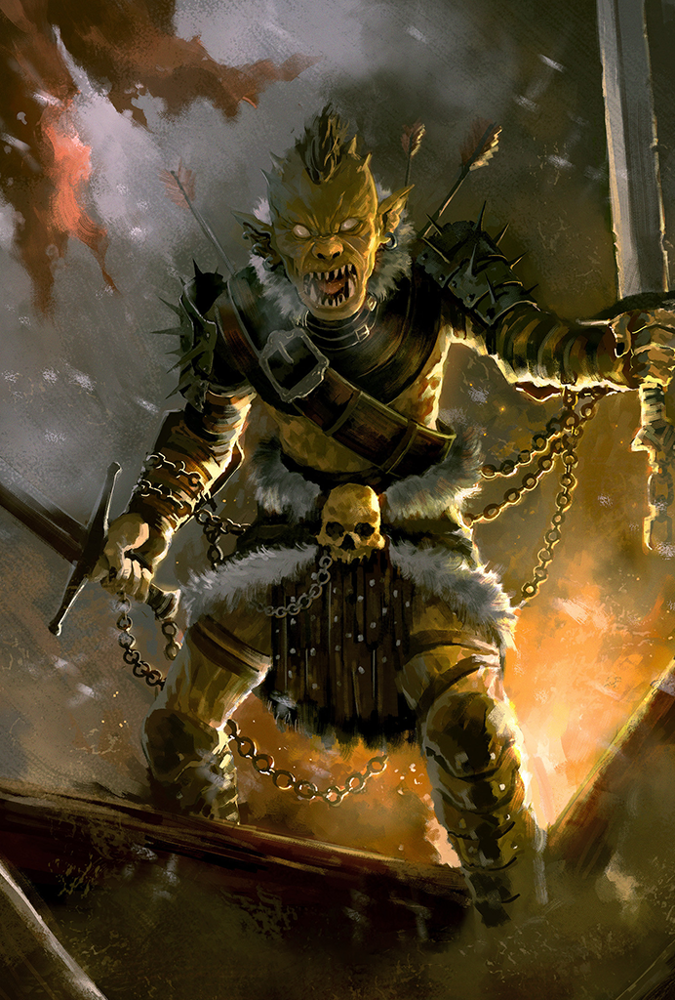

nexusmods-pathfinderkingmaker-92-974/Gnome, Goblin, Halfling/Goblin/GH-GO-MS-M106/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: his battle gear. He is wielding what seems to be a flail—a weapon consisting of a spiked head attached to a handle by a
Similarity: 0.10609209537506104

********************************************************************************

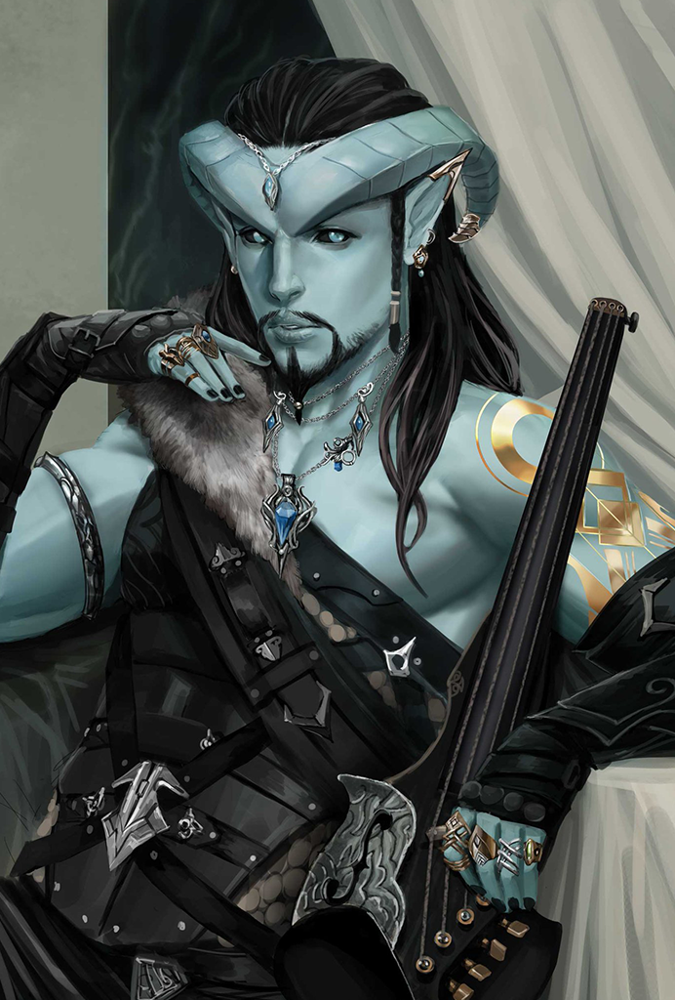

nexusmods-pathfinderkingmaker-92-974/MX (Mixed)/MX_Bard/Bard, Thundercaller/MX-BD-BT-M112/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: he appears to be wearing an elaborate hilted sword at his side, suggesting skill in melee combat. The armor is a
Similarity: 0.10565876960754395

********************************************************************************

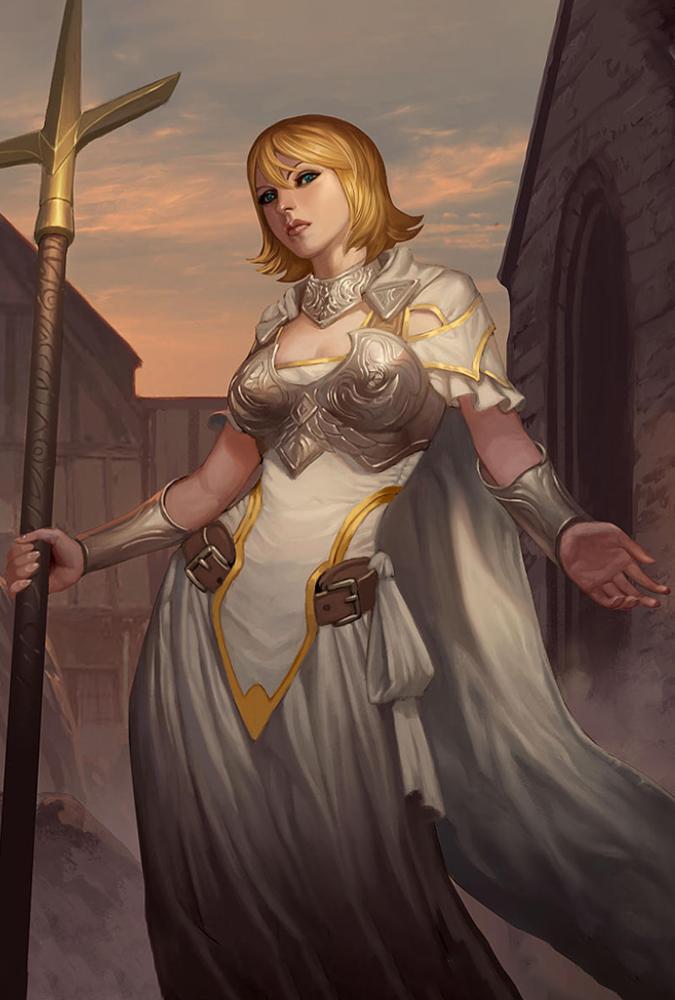

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Paladin, Cleric/Cleric, Ecclesitheurge, Herald Caller/HE-PC-CE-F210/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: or a paladin, given the nature of her armor and weapon. Speaking of which, she wields an impressive halberd, an
Similarity: 0.10526704788208008

********************************************************************************

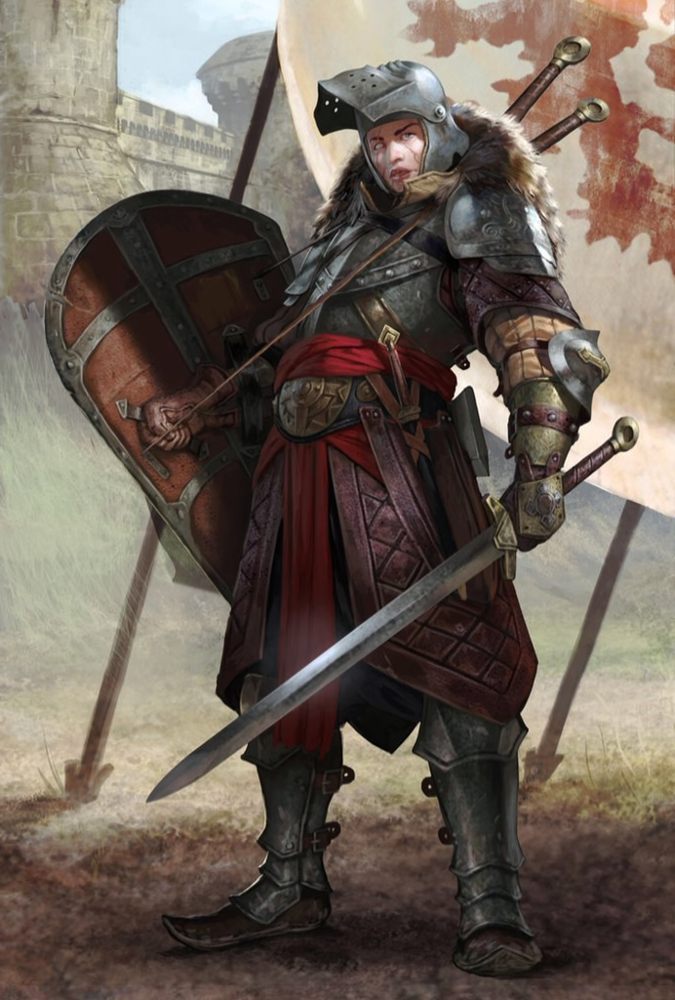

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Melee, Fighter/Shield (Stalwart Defender, Tower Shield Specialist)/HE-MF-SH-F101/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: primary weapon, and a large shield in his left, indicating a combat style that balances offense and defense. His armor
Similarity: 0.10420858860015869

********************************************************************************

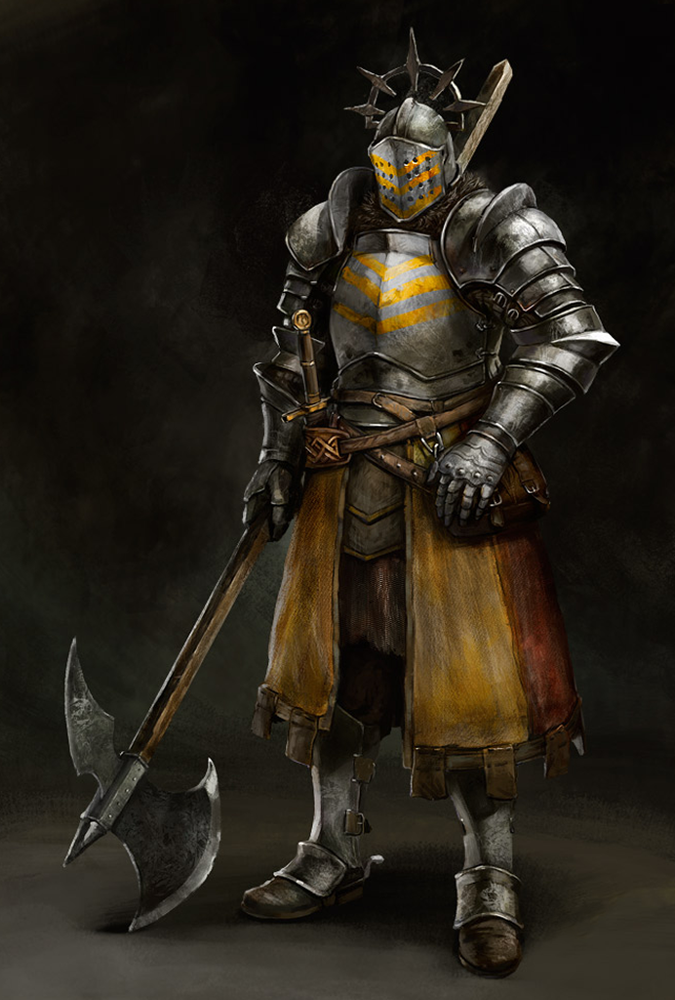

nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Melee, Fighter/Two-handed, Reach (Two-handed Fighter)/HE-MF-2H-M316/Fulllength.png

Query: closed helmet knight with a halberd
Portrait text: armor's torso may represent rank, affiliation, or simply personal style. The character holds a formidable halberd, a
Similarity: 0.10362857580184937

********************************************************************************

In [114]:
from IPython.display import Image, display, Pretty

query = input()
portraits, explanations = await retriever.get_portraits(query, experiment="v1")

def show_search_results(portraits, explanations):
    to_display = []
    for portrait, explanation in zip(portraits, explanations):
        to_display.append(Image(filename=portraits_path / portrait.fulllength_path))
        to_display.append(Pretty(data=portrait.fulllength_path))
        to_display += [Pretty(data=e.to_explanation()) for e in explanation]
        to_display.append(Pretty(data="*"*80))

    display(*to_display)

show_search_results(portraits, explanations)
    

 nexusmods-pathfinderkingmaker-92-974/HE (Human, Elf, Half-Elf)/HE_Melee, Fighter/Two-handed, Reach (Two-handed Fighter)/HE-MF-2H-M208/Fulllength.png


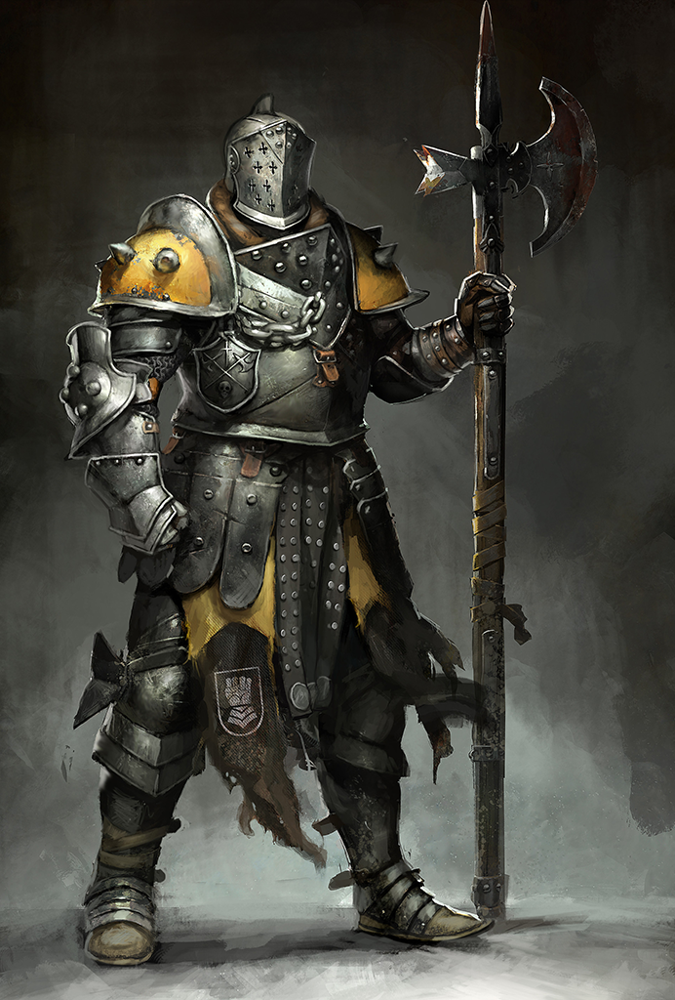

In [110]:
fullpath = input()
Image(filename=new_portraits_path / fullpath.strip())

In [86]:
[p for p in all_portraits if p.fulllength_path == "nexusmods-pathfinderkingmaker-92-974/MX (Mixed) Misc/MX_Misc_Headshots, Portraits/Portraits/MX-MS-PO-F125/Fulllength.png"]

[PortraitRecord(id=ObjectId('658de5701fa4223560383d5a'), fulllength_path='nexusmods-pathfinderkingmaker-92-974/MX (Mixed) Misc/MX_Misc_Headshots, Portraits/Portraits/MX-MS-PO-F125/Fulllength.png', medium_path='nexusmods-pathfinderkingmaker-92-974/MX (Mixed) Misc/MX_Misc_Headshots, Portraits/Portraits/MX-MS-PO-F125/Medium.png', small_path='nexusmods-pathfinderkingmaker-92-974/MX (Mixed) Misc/MX_Misc_Headshots, Portraits/Portraits/MX-MS-PO-F125/Small.png', tags=['MX (Mixed) Misc', 'MX_Misc_Headshots, Portraits', 'Portraits', 'MX-MS-PO-F125'], url='https://www.nexusmods.com/pathfinderkingmaker/mods/92', hash='3c7c30383c3c0c30', query='\nDescribe what is in a picture. Assume that it\'s a character for a table-top RPG game.\n\nSpecifically mention its gender, race, alignment, possible classes, and subclasses, weapon it\'s holding, armor, and any special traits.\n\nOutput a natural text description, and after two line breaks: a JSON formatted response like that:\n\n{natural description}\n\n{